In [133]:
# -*- coding: utf-8 -*-
%matplotlib inline
import numpy as np
import cv2
import glob
import re
from matplotlib import pyplot as plt
import time as t
print "OpenCV Version : %s " % cv2.__version__
# https://wiki.python.org/moin/PythonSpeed/PerformanceTips

OpenCV Version : 3.0.0 


In [161]:
w = 640
h = 480

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((7*7,3), np.float32)
objp[:,:2] = np.mgrid[0:7,0:7].T.reshape(-1,2) * 20

# Get current size
fig_size = plt.rcParams["figure.figsize"]
 
# Prints: [8.0, 6.0]
print "Current size:", fig_size
 
# Set figure width to 12 and height to 9
fig_size[0] = 18
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size

Current size: [18.0, 12.0]


## Extracción de imágenes utilizables


Primer conjunto

Image1-L.jpg False
Image1-R.jpg False


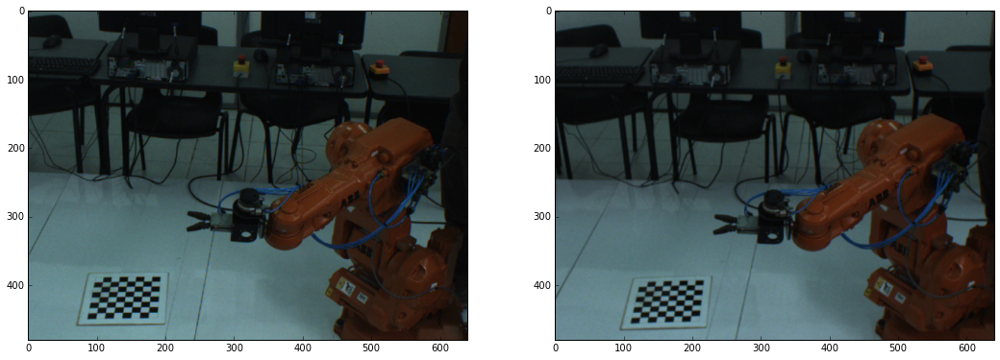

Image10-L.jpg True
Image10-R.jpg True


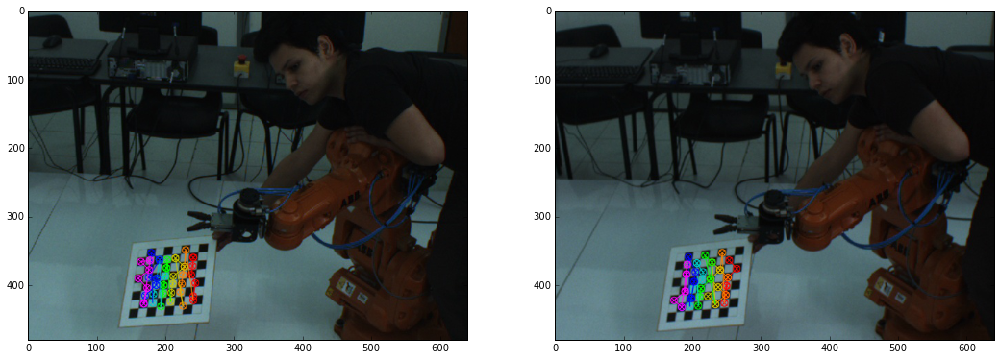

Image2-L.jpg True
Image2-R.jpg True


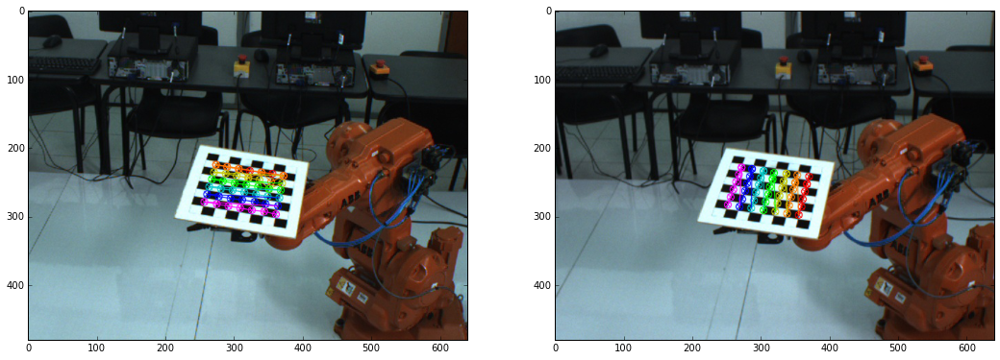

Image3-L.jpg True
Image3-R.jpg True


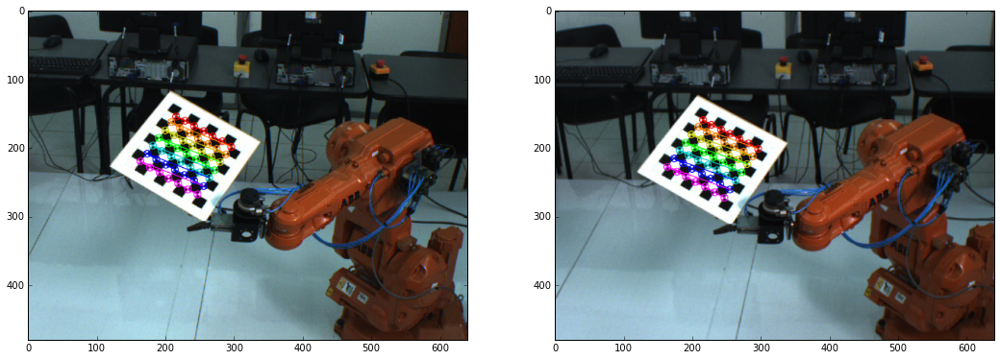

Image4-L.jpg True
Image4-R.jpg False


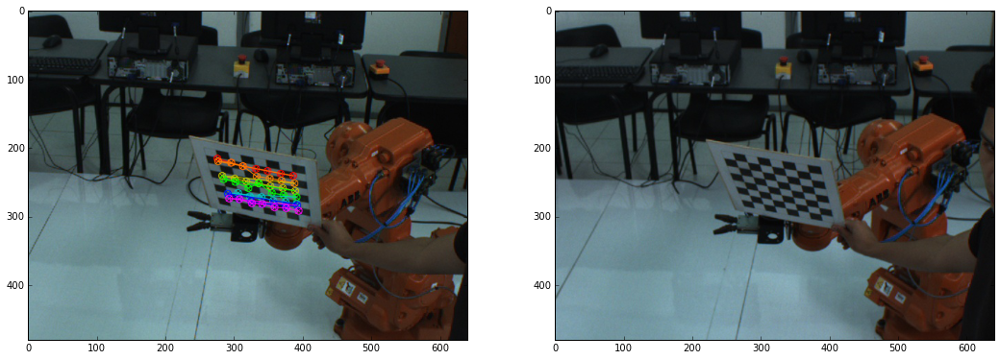

Image5-L.jpg True
Image5-R.jpg True


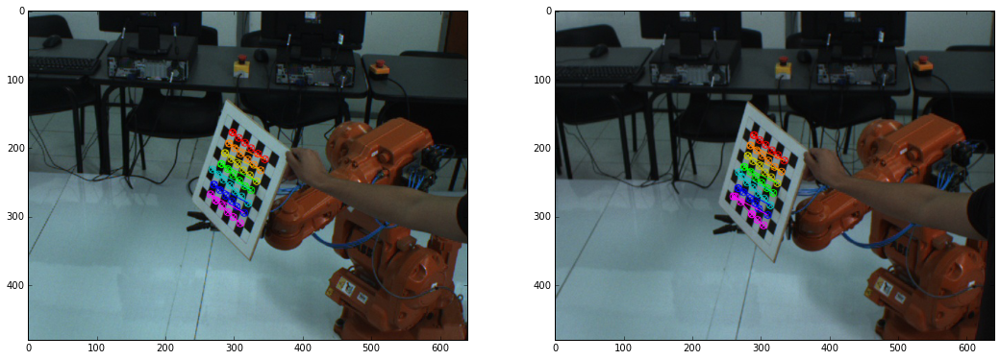

Image6-L.jpg True
Image6-R.jpg True


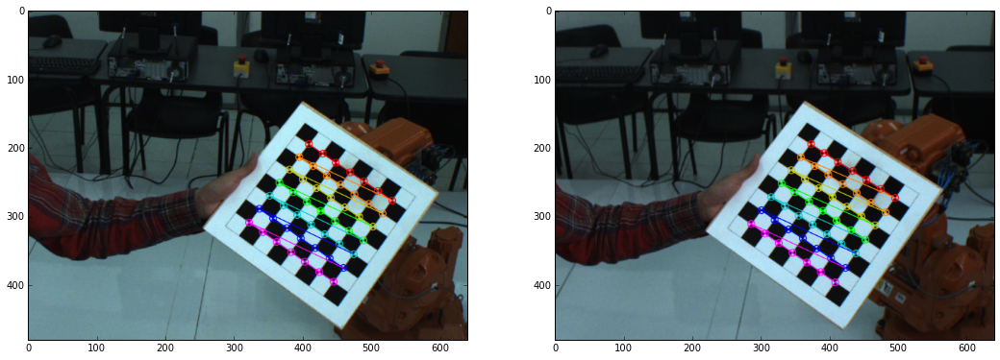

Image7-L.jpg False
Image7-R.jpg False


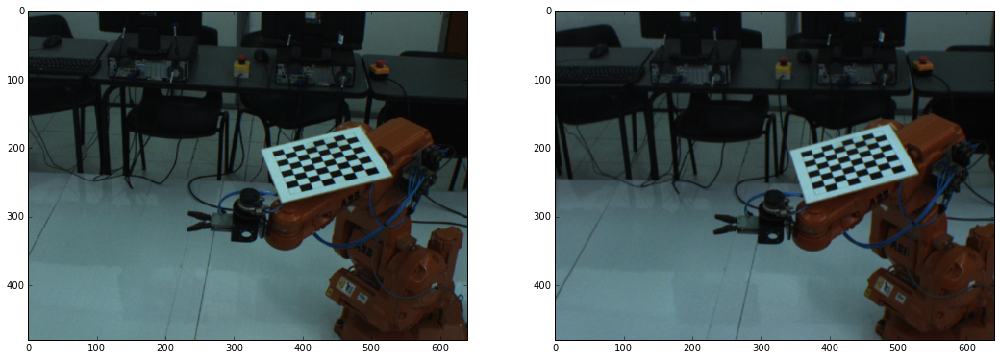

Image8-L.jpg True
Image8-R.jpg True


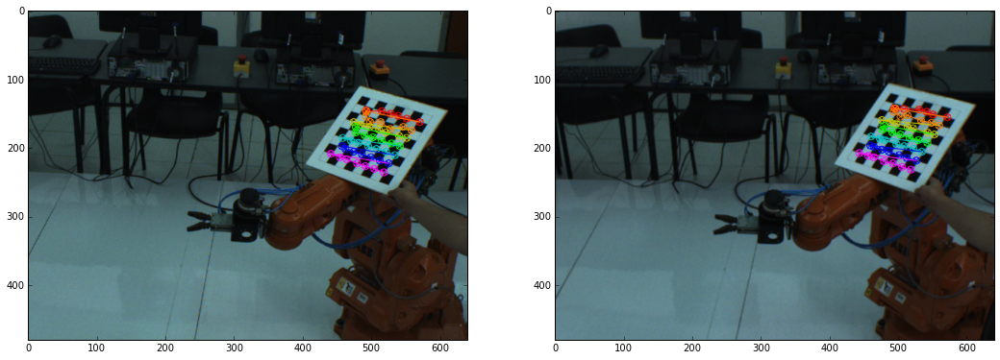

Image9-L.jpg True
Image9-R.jpg True


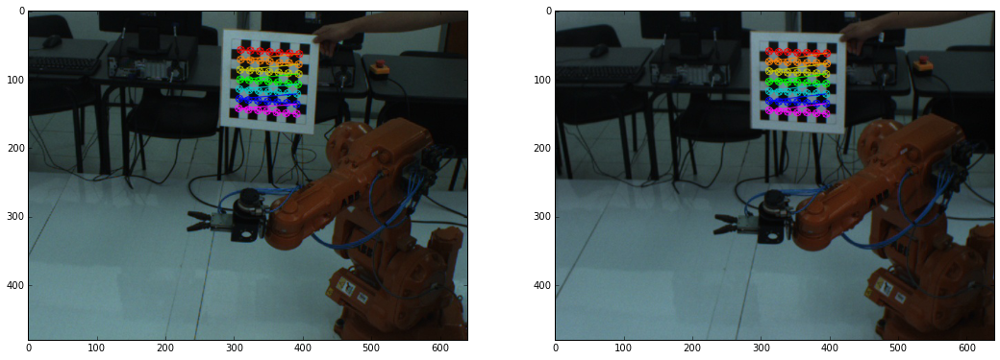

In [165]:
imagesL = glob.glob('img-1/*-L.jpg')
imagesR = glob.glob('img-1/*-R.jpg')

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (7,7), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (7,7), None)
    
    name1 = re.findall(r'[\w\d\-]+\.\w+',fnameL)[0]
    name2 = re.findall(r'[\w\d\-]+\.\w+',fnameR)[0]
    print name1, retL
    print name2, retR

    if retL is True:
        cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), criteria)
        cv2.drawChessboardCorners(imgL, (7,7), cornersL, retL)

    if retR is True:
        cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), criteria)
        cv2.drawChessboardCorners(imgR, (7,7), cornersR, retR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(imgL)
    plt.subplot(1,2,2), plt.imshow(imgR)
    plt.show()

Segundo conjunto

Image1-L.jpg True
Image1-R.jpg True


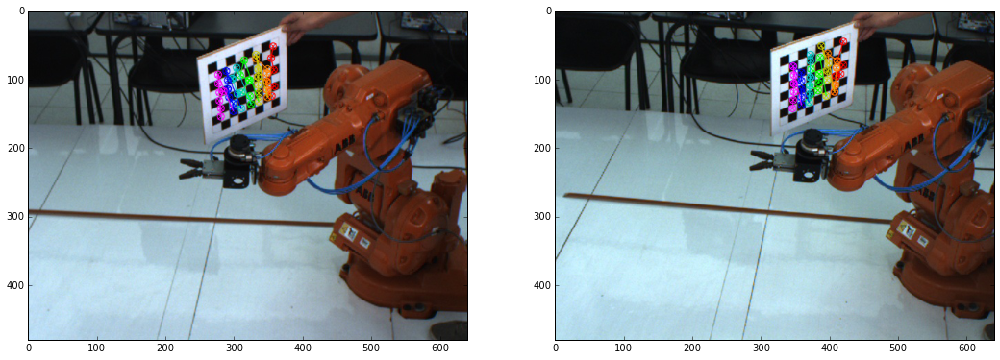

Image2-L.jpg False
Image2-R.jpg False


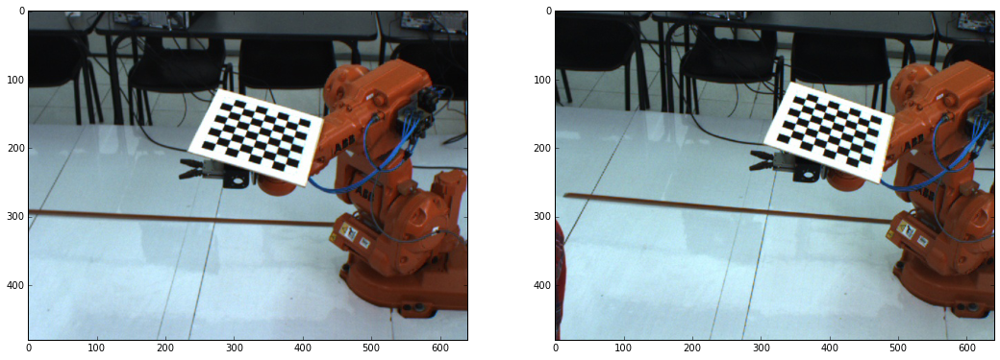

Image3-L.jpg True
Image3-R.jpg True


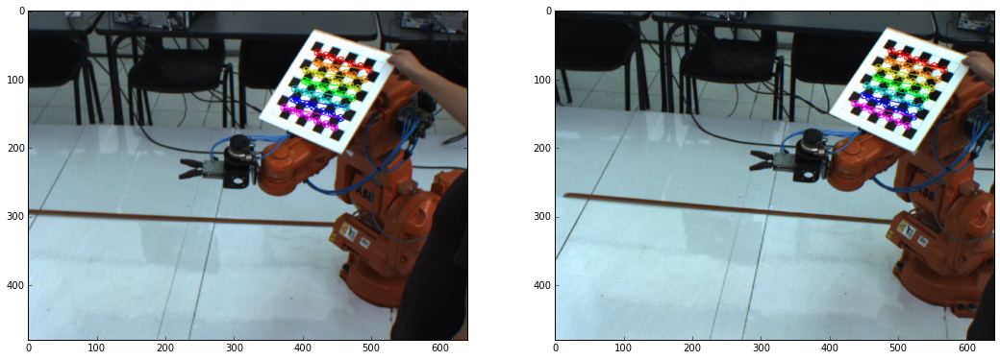

Image4-L.jpg True
Image4-R.jpg True


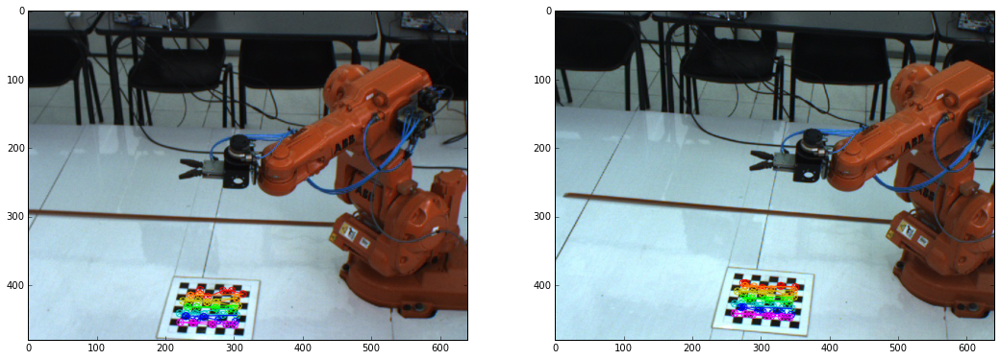

Image5-L.jpg True
Image5-R.jpg True


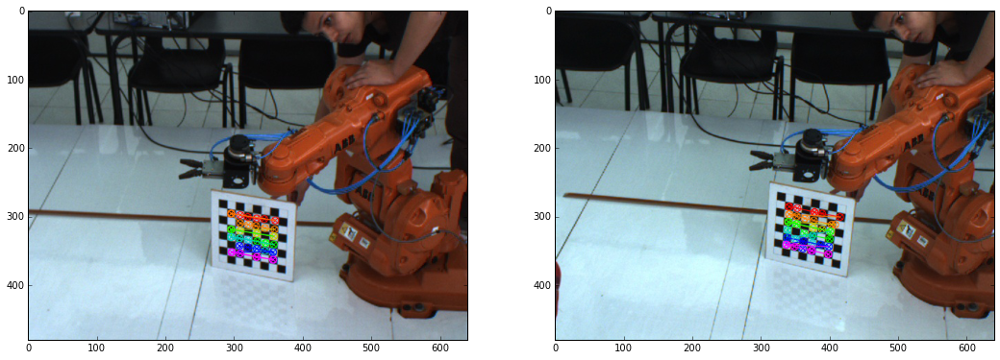

In [166]:
imagesL = glob.glob('img-2/*-L.jpg')
imagesR = glob.glob('img-2/*-R.jpg')

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (7,7), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (7,7), None)
    
    name1 = re.findall(r'[\w\d\-]+\.\w+',fnameL)[0]
    name2 = re.findall(r'[\w\d\-]+\.\w+',fnameR)[0]
    print name1, retL
    print name2, retR

    if retL is True:
        cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), criteria)
        cv2.drawChessboardCorners(imgL, (7,7), cornersL, retL)

    if retR is True:
        cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), criteria)
        cv2.drawChessboardCorners(imgR, (7,7), cornersR, retR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(imgL)
    plt.subplot(1,2,2), plt.imshow(imgR)
    plt.show()

Con las mejores imágenes de ambos conjuntos

Image3-2-L.jpg True
Image3-2-R.jpg True


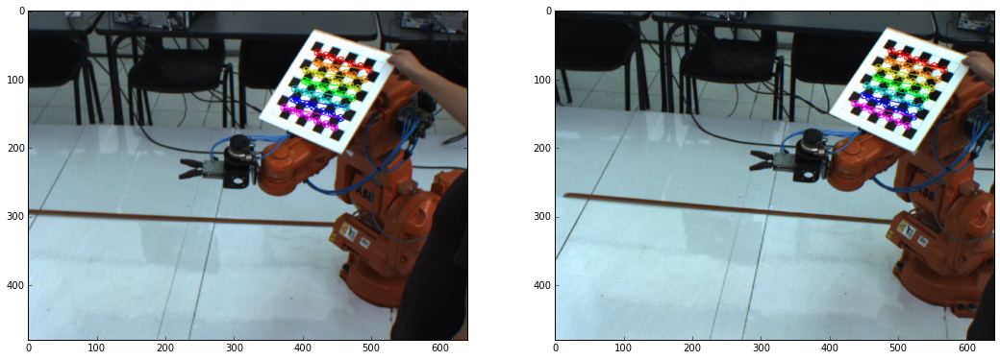

Image3-L.jpg True
Image3-R.jpg True


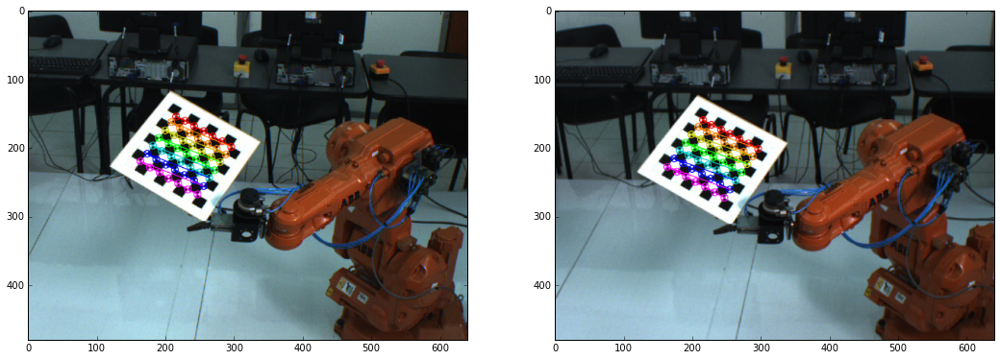

Image6-L.jpg True
Image6-R.jpg True


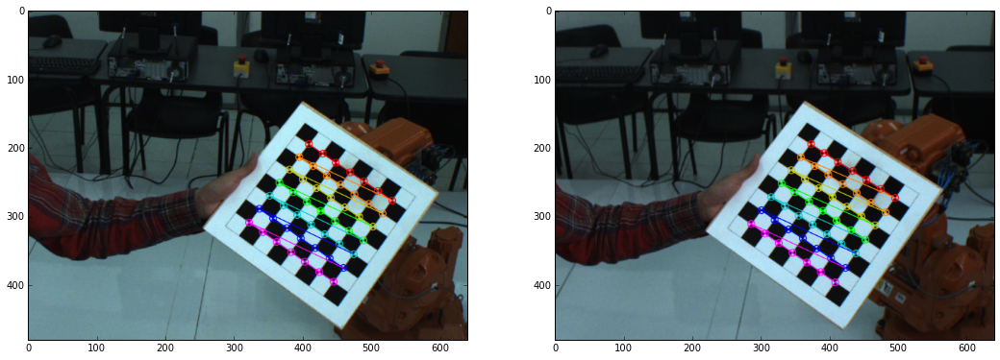

Image9-L.jpg True
Image9-R.jpg True


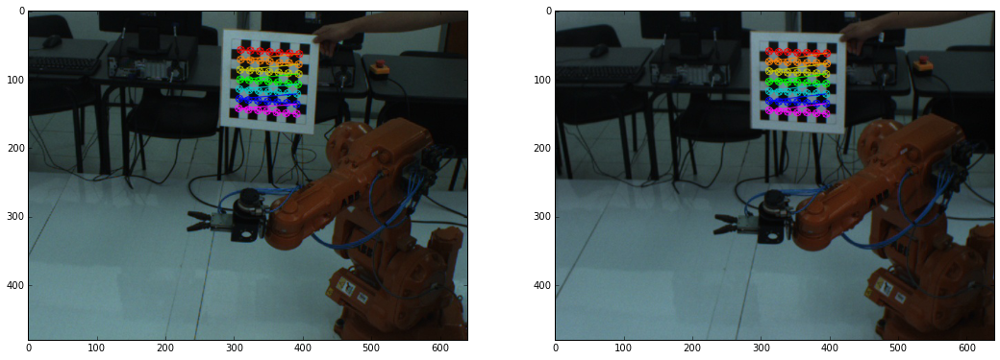

In [167]:
objpoints = []
imgpointsL = []
imgpointsR = []

imagesL = glob.glob('img/*-L.jpg')
imagesR = glob.glob('img/*-R.jpg')

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (7,7), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (7,7), None)
    
    name1 = re.findall(r'[\w\d\-]+\.\w+',fnameL)[0]
    name2 = re.findall(r'[\w\d\-]+\.\w+',fnameR)[0]
    print name1, retL
    print name2, retR
    
    cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), criteria)
    cv2.drawChessboardCorners(imgL, (7,7), cornersL, retL)
    
    cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), criteria)
    cv2.drawChessboardCorners(imgR, (7,7), cornersR, retR)
    
    objpoints.append(objp)
    imgpointsL.append(cornersL)
    imgpointsR.append(cornersR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(imgL)
    plt.subplot(1,2,2), plt.imshow(imgR)
    plt.show()

retL, mtxL, distL, rvecsL, tvecsL = cv2.calibrateCamera(objpoints, imgpointsL, (w,h), None, None)
retR, mtxR, distR, rvecsR, tvecsR = cv2.calibrateCamera(objpoints, imgpointsR, (w,h), None, None)

In [168]:
print "Matriz cámara izquierda:\n{}\n".format(mtxL)
print "Matriz cámara derecha:\n{}".format(mtxR)

Matriz cámara izquierda:
[[ 751.23328476    0.          309.00548671]
 [   0.          736.80190945  299.87923321]
 [   0.            0.            1.        ]]

Matriz cámara derecha:
[[ 893.80075915    0.          406.65002666]
 [   0.          879.89009167  252.46724262]
 [   0.            0.            1.        ]]


* Segunda cámara

In [169]:
errL = 0
errR = 0

for i in xrange(len(objpoints)):
    imgpoints2L, _ = cv2.projectPoints(objpoints[i], rvecsL[i], tvecsL[i], mtxL, distL)
    imgpoints2R, _ = cv2.projectPoints(objpoints[i], rvecsR[i], tvecsR[i], mtxR, distR)
    errorL = cv2.norm(imgpointsL[i],imgpoints2L, cv2.NORM_L2) / len(imgpoints2L)
    errorR = cv2.norm(imgpointsR[i],imgpoints2R, cv2.NORM_L2) / len(imgpoints2R)
    errL += errorL
    errR += errorR

print "Error izquierda:   {}\n".format(errL/len(objpoints))
print "Error derecha:     {}".format(errR/len(objpoints))

Error izquierda:   0.0910622919412

Error derecha:     0.0612756599352


## Proyección usando las matrices de cámara

In [170]:
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    img = cv2.line(img, corner, tuple(imgpts[0].ravel()), (255, 0, 0), 5)
    img = cv2.line(img, corner, tuple(imgpts[1].ravel()), (0, 255, 0), 5)
    img = cv2.line(img, corner, tuple(imgpts[2].ravel()), (0, 0, 255), 5)
    return img

def drawCube(img, corners, imgpts):
    imgpts = np.int32(imgpts).reshape(-1, 2)

    # draw ground floor in green
    img = cv2.drawContours(img, [imgpts[:4]], -1, (0, 255, 0), -3)

    # draw pillars in blue color
    for i, j in zip(range(4), range(4, 8)):
        img = cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]), (255), 3)

    # draw top layer in red color
    img = cv2.drawContours(img, [imgpts[4:]], -1, (0, 0, 255), 3)

    return img

axis = np.float32([[4, 0, 0], [0, 4, 0], [0, 0, -4]]).reshape(-1, 3) * 20
axis2 = np.float32([[0, 0, 0], [0, 4, 0], [4, 4, 0], [4, 0, 0], [0, 0, -4], [0, 4, -4], [4, 4, -4], [4, 0, -4]]) * 20

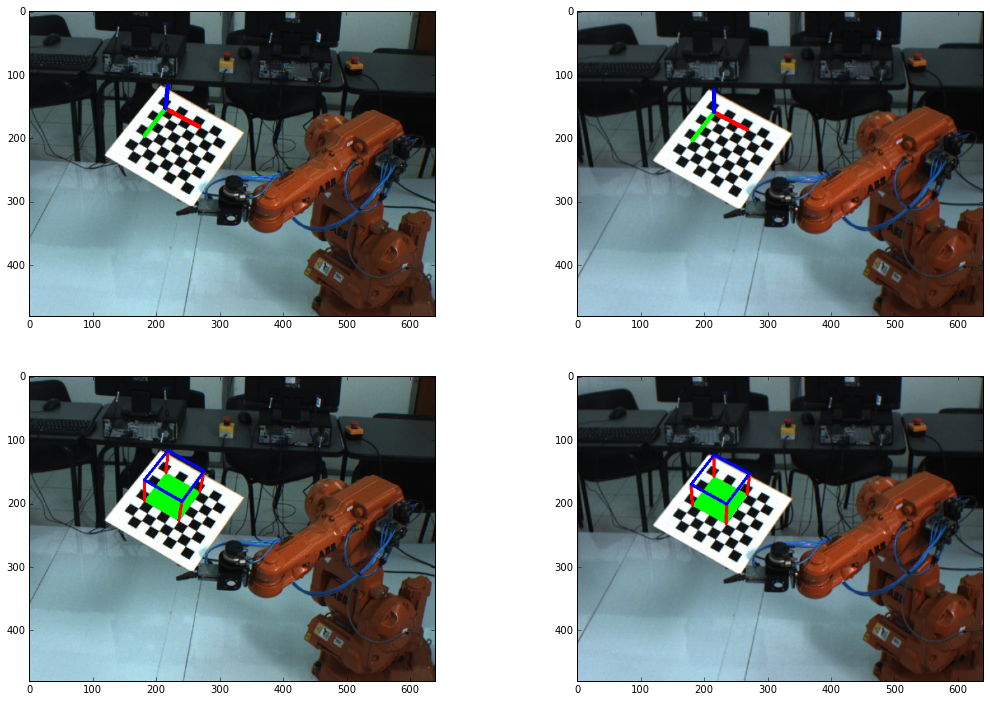

In [171]:
img1 = cv2.imread('img\Image3-L.jpg')
img2 = cv2.imread('img\Image3-R.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
ret1, corners1 = cv2.findChessboardCorners(gray1, (7, 7), None)
ret2, corners2 = cv2.findChessboardCorners(gray2, (7, 7), None)
corner1 = cv2.cornerSubPix(gray1, corners1, (11, 11), (-1, -1), criteria)
corner2 = cv2.cornerSubPix(gray2, corners2, (11, 11), (-1, -1), criteria)

ret1, rvecs1, tvecs1 = cv2.solvePnP(objp, corner1, mtxL, distL)
ret2, rvecs2, tvecs2 = cv2.solvePnP(objp, corner2, mtxR, distR)
imgpts11, jac11 = cv2.projectPoints(axis, rvecs1, tvecs1, mtx1, dist1)
imgpts12, jac12 = cv2.projectPoints(axis2, rvecs1, tvecs1, mtx1, dist1)
imgpts21, jac21 = cv2.projectPoints(axis, rvecs2, tvecs2, mtx2, dist2)
imgpts22, jac22 = cv2.projectPoints(axis2, rvecs2, tvecs2, mtx2, dist2)

ax1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
cb1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
ax2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
cb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

ax1 = draw(ax1, corner1, imgpts11)
ax2 = draw(ax2, corner2, imgpts21)

cb1 = drawCube(cb1, corner1, imgpts12)
cb2 = drawCube(cb2, corner2, imgpts22)

plt.subplot(2,2,1), plt.imshow(ax1)
plt.subplot(2,2,2), plt.imshow(ax2)
plt.subplot(2,2,3), plt.imshow(cb1)
plt.subplot(2,2,4), plt.imshow(cb2)
plt.show()

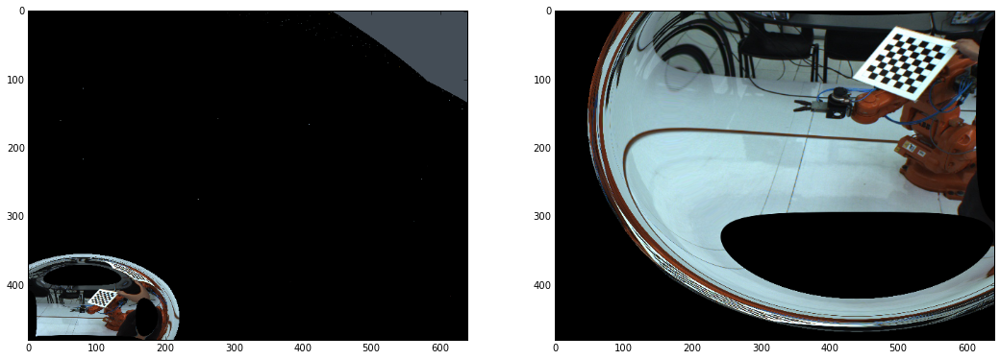

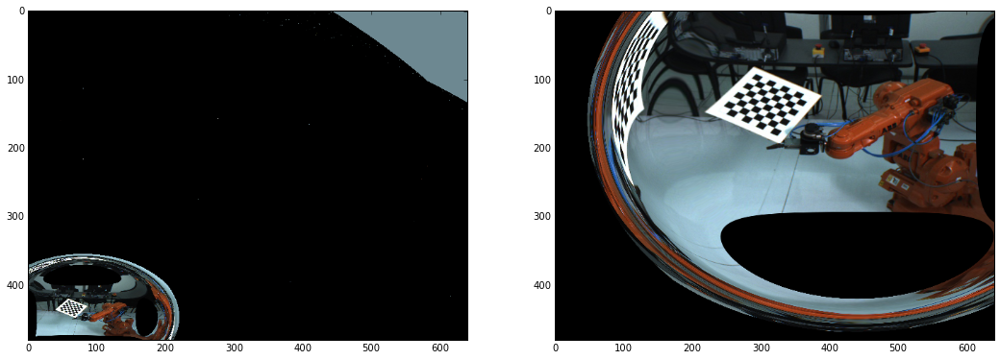

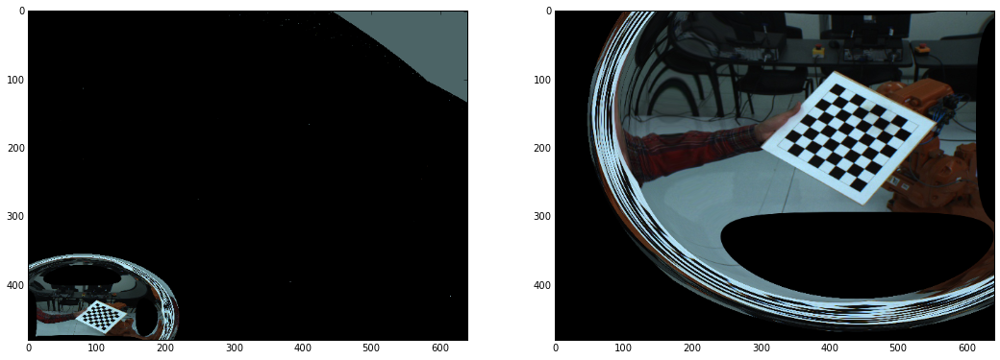

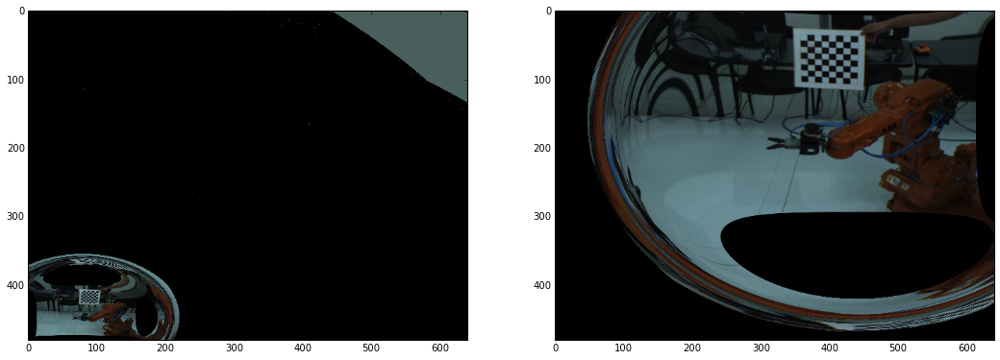

In [174]:
nmtxL, roiL = cv2.getOptimalNewCameraMatrix(mtxL, distL, (w,h), 1, (w,h))
nmtxR, roiR = cv2.getOptimalNewCameraMatrix(mtxR, distR, (w,h), 1, (w,h))

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    imgL = cv2.undistort(imgL, mtxL, distL, None, nmtxL)
    imgR = cv2.undistort(imgR, mtxR, distR, None, nmtxR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1),plt.imshow(imgL)
    plt.subplot(1,2,2),plt.imshow(imgR)
    plt.show()

True


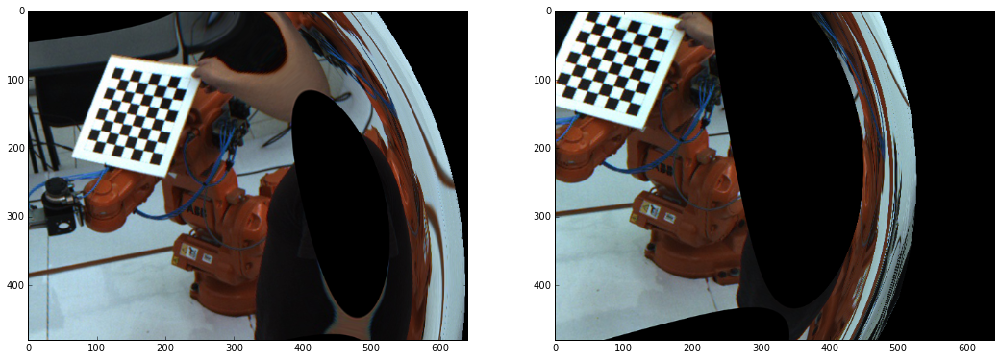

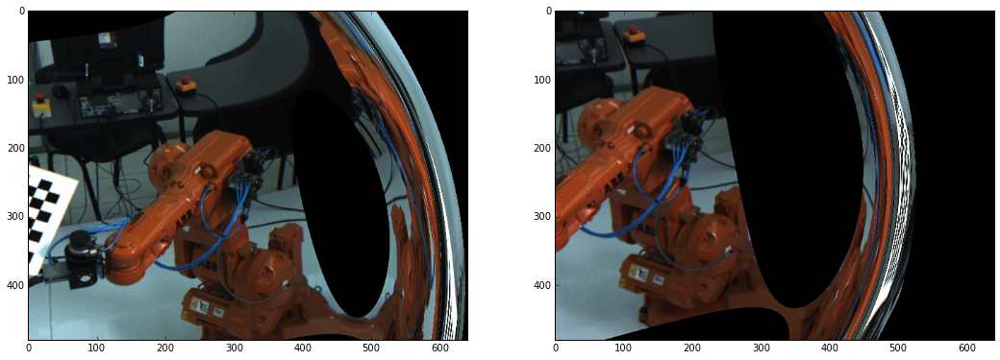

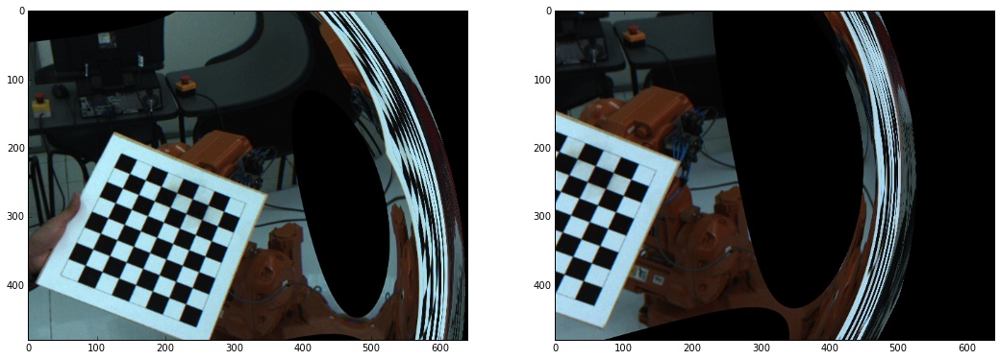

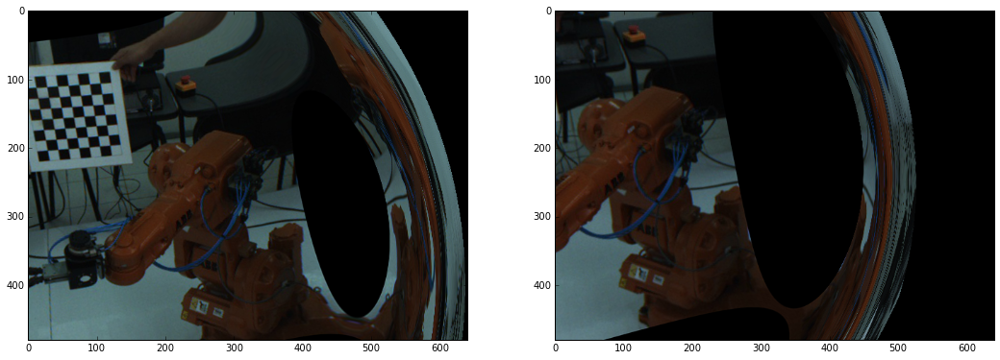

In [175]:
objpoints1 = []
imgpoints1 = []
objpoints2 = []
imgpoints2 = []

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (7,7), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (7,7), None)

    if retL is True:
        objpoints1.append(objp)

        cv2.cornerSubPix(grayL,cornersL,(11,11),(-1,-1),criteria)
        imgpoints1.append(cornersL)

    if retR is True:
        objpoints2.append(objp)

        cv2.cornerSubPix(grayR,cornersR,(11,11),(-1,-1),criteria)
        imgpoints2.append(cornersR)

print objpoints1 == objpoints2

ret, mtx1, dist1, mtx2, dist2, R, T, E, F  = cv2.stereoCalibrate(objpoints1, imgpoints1, imgpoints2,
                                                                 mtx1, dist1, mtx2, dist2, (640,480),
                                                                 cv2.CALIB_SAME_FOCAL_LENGTH+cv2.CALIB_FIX_INTRINSIC+cv2.CALIB_FIX_ASPECT_RATIO+cv2.CALIB_USE_INTRINSIC_GUESS,
                                                                 criteria)
R1, R2, P1, P2, Q, ROI1, ROI2 = cv2.stereoRectify(mtx1, dist1, mtx2, dist2, (640,480), R, T, flags=cv2.CALIB_ZERO_DISPARITY)
map1L, map2L = cv2.initUndistortRectifyMap(mtx1, dist1, R1, mtx1, (640,480), cv2.CV_32FC1)
map1R, map2R = cv2.initUndistortRectifyMap(mtx2, dist2, R2, mtx2, (640,480), cv2.CV_32FC1)

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    dstL = cv2.remap(imgL, map1L, map2L, cv2.INTER_CUBIC)
    dstR = cv2.remap(imgR, map1R, map2R, cv2.INTER_CUBIC)
    dstL = cv2.cvtColor(dstL, cv2.COLOR_BGR2RGB)
    dstR = cv2.cvtColor(dstR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(dstL)
    plt.subplot(1,2,2), plt.imshow(dstR)
    plt.show()

In [106]:
help(cv2.initUndistortRectifyMap)

Help on built-in function initUndistortRectifyMap:

initUndistortRectifyMap(...)
    initUndistortRectifyMap(cameraMatrix, distCoeffs, R, newCameraMatrix, size, m1type[, map1[, map2]]) -> map1, map2



In [120]:
nms = dir(cv2) # list of everything in the cv2 module
[m for m in nms if 'INTER' in m]

['COLORMAP_WINTER',
 'HISTCMP_INTERSECT',
 'IMWRITE_JPEG_RST_INTERVAL',
 'INTERSECT_FULL',
 'INTERSECT_NONE',
 'INTERSECT_PARTIAL',
 'INTER_AREA',
 'INTER_BITS',
 'INTER_BITS2',
 'INTER_CUBIC',
 'INTER_LANCZOS4',
 'INTER_LINEAR',
 'INTER_MAX',
 'INTER_NEAREST',
 'INTER_TAB_SIZE',
 'INTER_TAB_SIZE2']